In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 645.9/645.9 kB 10.8 MB/s eta 0:00:00


In [ ]:
from ultralytics import YOLO
from matplotlib import pyplot as plt
from PIL import Image

In [ ]:
model = YOLO('yolov8n-seg.yaml')
model = YOLO('yolov8n.pt')


                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128

In [ ]:
#Withut this Colab is giving an error when installing Roboflow
import locale
locale.getpreferredencoding = lambda: "UTF-8"

In [ ]:
%cat /content/gdrive/MyDrive/namespace/data.yaml

train: ../train/images
val: ../valid/images
test: ../test/images

nc: 1
names: ['koala']

roboflow:
  workspace: bubt-irkad
  project: en
  version: 1
  license: CC BY 4.0
  url: https://universe.roboflow.com/bubt-irkad/en/dataset/1

In [ ]:
import yaml
with open("/content/gdrive/MyDrive/namespace/data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])


In [ ]:

#Define a project --> Destination directory for all results
project = "/content/gdrive/MyDrive/namespace/result"
#Define subdirectory for this specific training
name = "200_epochs-" #note that if you run the training again, it creates a directory: 200_epochs-2

In [ ]:

# Train the model
results = model.train(data='/content/gdrive/MyDrive/namespace/data.yaml',
                      project=project,
                      name=name,
                      epochs=200,
                      patience=0, #I am setting patience=0 to disable early stopping.
                      batch=4,
                      imgsz=800)

Ultralytics YOLOv8.0.219 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/gdrive/MyDrive/namespace/data.yaml, epochs=200, patience=0, batch=4, imgsz=800, save=True, save_period=-1, cache=False, device=None, workers=8, project=/content/gdrive/MyDrive/namespace/result, name=200_epochs-3, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show

train: Scanning /content/gdrive/MyDrive/namespace/train/labels.cache... 114 images, 0 backgrounds, 0 corrupt: 100%|██████████| 114/114 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/gdrive/MyDrive/namespace/valid/labels.cache... 33 images, 0 backgrounds, 0 corrupt: 100%|██████████| 33/33 [00:00<?, ?it/s]


Plotting labels to /content/gdrive/MyDrive/namespace/result/200_epochs-3/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)


/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:2443: TracerWarning: Converting a tensor to a Python boolean might cause the trace to be incorrect. We can't record the data flow of Python values, so this value will be treated as a constant in the future. This means that the trace might not generalize to other inputs!
  if size_prods == 1:


Image sizes 800 train, 800 val
Using 2 dataloader workers
Logging results to /content/gdrive/MyDrive/namespace/result/200_epochs-3
Starting training for 200 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/200      1.26G      1.772      3.129      2.251          6        800: 100%|██████████| 29/29 [00:06<00:00,  4.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.66it/s]

                   all         33         40    0.00343       0.85      0.122     0.0341



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/200      1.01G      1.711      2.704      2.189         10        800: 100%|██████████| 29/29 [00:05<00:00,  4.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.72it/s]

                   all         33         40    0.00374      0.925      0.306     0.0892



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/200         1G      1.764       2.63       2.25          9        800: 100%|██████████| 29/29 [00:05<00:00,  5.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  9.89it/s]

                   all         33         40     0.0411        0.1     0.0188    0.00348



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/200      1.01G      1.899       2.86       2.34          4        800: 100%|██████████| 29/29 [00:04<00:00,  7.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  8.49it/s]

                   all         33         40      0.249      0.225      0.168     0.0327



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/200      1.02G      1.902      2.703      2.347          7        800: 100%|██████████| 29/29 [00:06<00:00,  4.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.74it/s]

                   all         33         40      0.119        0.4      0.105     0.0329



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/200      1.01G      2.064      2.715      2.534          5        800: 100%|██████████| 29/29 [00:04<00:00,  6.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00, 10.15it/s]

                   all         33         40      0.037        0.4     0.0419     0.0135



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/200      1.01G      1.929      2.685      2.351          6        800: 100%|██████████| 29/29 [00:04<00:00,  6.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  8.86it/s]

                   all         33         40      0.296      0.425      0.297     0.0863



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/200      1.01G      1.874      2.673       2.35          2        800: 100%|██████████| 29/29 [00:06<00:00,  4.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.95it/s]

                   all         33         40      0.102      0.425      0.103     0.0288



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/200      1.01G      1.792      2.503      2.256          7        800: 100%|██████████| 29/29 [00:04<00:00,  6.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00, 10.48it/s]

                   all         33         40     0.0557      0.225     0.0201    0.00377



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/200      1.01G      1.795      2.405       2.28          5        800: 100%|██████████| 29/29 [00:04<00:00,  6.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.82it/s]


                   all         33         40     0.0989      0.125     0.0249    0.00483

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/200      1.02G      1.881      2.471      2.366          7        800: 100%|██████████| 29/29 [00:06<00:00,  4.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  9.45it/s]

                   all         33         40       0.11      0.325     0.0805     0.0177



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/200      1.01G       1.77       2.28       2.27          8        800: 100%|██████████| 29/29 [00:04<00:00,  7.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00, 11.09it/s]

                   all         33         40      0.317      0.325      0.198     0.0493



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/200      1.01G      1.793      2.403      2.258          6        800: 100%|██████████| 29/29 [00:04<00:00,  5.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.30it/s]

                   all         33         40      0.141      0.375      0.107     0.0281



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/200      1.01G      1.787      2.435      2.269          4        800: 100%|██████████| 29/29 [00:06<00:00,  4.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00, 10.59it/s]

                   all         33         40      0.451        0.6      0.404      0.143



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/200      1.02G      1.705      2.261      2.238          9        800: 100%|██████████| 29/29 [00:04<00:00,  6.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00, 10.63it/s]

                   all         33         40      0.385      0.471      0.337      0.123



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/200      1.01G      1.744      2.372      2.287          2        800: 100%|██████████| 29/29 [00:05<00:00,  5.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.14it/s]

                   all         33         40      0.219        0.5      0.195     0.0646



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/200      1.01G      1.689      2.235      2.208          5        800: 100%|██████████| 29/29 [00:05<00:00,  5.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00, 11.05it/s]

                   all         33         40      0.422      0.575      0.381      0.113



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/200      1.01G      1.721      2.289      2.184          3        800: 100%|██████████| 29/29 [00:04<00:00,  7.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  8.03it/s]

                   all         33         40      0.475      0.565      0.486       0.15



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/200         1G      1.733      2.163        2.2          6        800: 100%|██████████| 29/29 [00:06<00:00,  4.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.86it/s]

                   all         33         40      0.529      0.575      0.424      0.118



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/200      1.01G      1.707      2.135       2.27          5        800: 100%|██████████| 29/29 [00:04<00:00,  5.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  9.39it/s]

                   all         33         40       0.41      0.573      0.463       0.12



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/200      1.01G      1.831      2.284      2.252          4        800: 100%|██████████| 29/29 [00:04<00:00,  6.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00, 11.15it/s]

                   all         33         40      0.234      0.436      0.173     0.0458



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/200      1.01G      1.754        2.2      2.191          6        800: 100%|██████████| 29/29 [00:06<00:00,  4.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.05it/s]

                   all         33         40      0.185        0.5      0.178     0.0518



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/200      1.01G      1.728      2.078      2.217          7        800: 100%|██████████| 29/29 [00:04<00:00,  6.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00, 11.29it/s]

                   all         33         40      0.383      0.481      0.369      0.135



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/200      1.02G      1.675      2.154      2.224          6        800: 100%|██████████| 29/29 [00:04<00:00,  6.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  9.68it/s]

                   all         33         40      0.428        0.5      0.403      0.116



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/200      1.01G      1.546      1.965      2.076          4        800: 100%|██████████| 29/29 [00:06<00:00,  4.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.55it/s]

                   all         33         40      0.525      0.475      0.524      0.156



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/200      1.01G      1.706      2.081      2.185          5        800: 100%|██████████| 29/29 [00:04<00:00,  6.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00, 10.77it/s]

                   all         33         40      0.593      0.525      0.577      0.207



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/200      1.01G      1.739      2.087      2.218          5        800: 100%|██████████| 29/29 [00:04<00:00,  6.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.77it/s]


                   all         33         40      0.327      0.534      0.296      0.102

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/200      1.01G      1.859       2.04      2.314         10        800: 100%|██████████| 29/29 [00:06<00:00,  4.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  9.76it/s]

                   all         33         40      0.471      0.578       0.49      0.185



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/200      1.01G      1.799      2.111      2.264          3        800: 100%|██████████| 29/29 [00:04<00:00,  6.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  9.79it/s]


                   all         33         40      0.398      0.575      0.347     0.0967

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/200      1.01G      1.716      2.079       2.19          5        800: 100%|██████████| 29/29 [00:05<00:00,  4.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.52it/s]

                   all         33         40      0.339      0.475      0.367      0.125



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/200      1.01G      1.602      1.905      2.103          3        800: 100%|██████████| 29/29 [00:05<00:00,  4.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00, 11.03it/s]

                   all         33         40      0.366      0.475       0.35      0.117



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/200      1.01G       1.65      2.003      2.115          6        800: 100%|██████████| 29/29 [00:04<00:00,  6.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00, 10.13it/s]

                   all         33         40      0.365      0.425      0.319      0.106



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/200      1.01G      1.641      1.863       2.08          9        800: 100%|██████████| 29/29 [00:05<00:00,  4.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.37it/s]

                   all         33         40      0.393      0.575      0.504      0.154



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/200      1.01G      1.642      1.891      2.127          4        800: 100%|██████████| 29/29 [00:05<00:00,  5.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00, 10.30it/s]

                   all         33         40      0.358        0.5      0.307      0.118



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/200         1G      1.672      1.889      2.083          8        800: 100%|██████████| 29/29 [00:04<00:00,  7.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00, 11.11it/s]

                   all         33         40      0.585        0.5      0.589      0.239



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/200      1.01G      1.589      1.887      2.063          8        800: 100%|██████████| 29/29 [00:06<00:00,  4.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.77it/s]

                   all         33         40      0.626      0.575      0.553      0.213



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/200      1.01G      1.672      2.032      2.152          4        800: 100%|██████████| 29/29 [00:05<00:00,  5.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00, 10.64it/s]

                   all         33         40      0.542        0.6      0.437      0.168



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/200      1.01G      1.601      1.906      2.106          5        800: 100%|██████████| 29/29 [00:04<00:00,  6.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00, 10.37it/s]

                   all         33         40      0.598       0.55      0.568      0.163



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/200      1.01G       1.69      1.988      2.191          3        800: 100%|██████████| 29/29 [00:06<00:00,  4.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.41it/s]

                   all         33         40      0.363      0.425      0.357     0.0885



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/200      1.01G      1.644      1.858      2.119          5        800: 100%|██████████| 29/29 [00:04<00:00,  6.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00, 10.52it/s]

                   all         33         40      0.556      0.475      0.491      0.195



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/200      1.01G       1.65      1.929      2.143          6        800: 100%|██████████| 29/29 [00:04<00:00,  6.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  7.93it/s]

                   all         33         40      0.638        0.5      0.493      0.193



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/200      1.02G      1.646      1.887      2.141          6        800: 100%|██████████| 29/29 [00:07<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.49it/s]

                   all         33         40      0.521      0.545      0.471      0.177



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/200      1.01G      1.591      1.843      2.129          5        800: 100%|██████████| 29/29 [00:04<00:00,  6.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00, 10.01it/s]

                   all         33         40       0.55       0.65      0.597      0.174



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/200      1.01G      1.545      1.828      2.065          5        800: 100%|██████████| 29/29 [00:04<00:00,  6.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  8.82it/s]

                   all         33         40       0.67        0.6       0.58      0.179



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/200      1.01G      1.636      1.826      2.173          5        800: 100%|██████████| 29/29 [00:07<00:00,  4.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  9.51it/s]

                   all         33         40      0.639       0.62       0.56       0.21



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/200      1.01G      1.544      1.863      2.056          4        800: 100%|██████████| 29/29 [00:04<00:00,  6.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00, 10.69it/s]

                   all         33         40       0.52      0.575      0.465      0.203



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/200      1.01G      1.478      1.728      1.933          5        800: 100%|██████████| 29/29 [00:04<00:00,  6.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  7.47it/s]

                   all         33         40      0.605      0.575      0.551      0.231



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/200      1.01G      1.575      1.762      2.037          6        800: 100%|██████████| 29/29 [00:06<00:00,  4.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00, 10.01it/s]

                   all         33         40      0.682       0.55      0.642      0.243



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/200      1.01G      1.589      1.784      2.029          8        800: 100%|██████████| 29/29 [00:04<00:00,  7.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  9.89it/s]

                   all         33         40      0.633      0.648      0.519      0.204



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/200      1.01G      1.632      1.832      2.058          7        800: 100%|██████████| 29/29 [00:05<00:00,  5.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.02it/s]

                   all         33         40      0.488       0.65      0.514      0.201



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/200         1G       1.59      1.774      2.073          2        800: 100%|██████████| 29/29 [00:06<00:00,  4.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  9.28it/s]

                   all         33         40      0.728       0.55      0.563      0.183



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/200      1.01G      1.508      1.764      2.055          3        800: 100%|██████████| 29/29 [00:04<00:00,  6.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  9.76it/s]

                   all         33         40      0.516      0.525      0.488        0.2



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/200      1.01G      1.536      1.843       2.05          2        800: 100%|██████████| 29/29 [00:05<00:00,  5.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.94it/s]

                   all         33         40      0.657      0.671      0.616      0.262



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/200      1.01G      1.541      1.835       2.02          7        800: 100%|██████████| 29/29 [00:05<00:00,  5.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00, 10.99it/s]

                   all         33         40      0.762      0.722      0.746      0.312



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/200      1.01G      1.493      1.645       1.93          9        800: 100%|██████████| 29/29 [00:04<00:00,  7.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00, 10.60it/s]

                   all         33         40      0.694      0.825      0.694      0.283



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/200      1.01G      1.487      1.639      1.983          5        800: 100%|██████████| 29/29 [00:05<00:00,  5.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.49it/s]

                   all         33         40      0.587       0.75      0.606      0.238



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/200      1.01G      1.428      1.626      1.947          7        800: 100%|██████████| 29/29 [00:05<00:00,  5.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00, 10.35it/s]

                   all         33         40      0.637      0.791      0.662       0.25



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/200      1.01G      1.503      1.638      2.081          7        800: 100%|██████████| 29/29 [00:04<00:00,  7.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00, 10.97it/s]

                   all         33         40      0.636      0.675      0.559      0.212



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/200      1.01G      1.512        1.7       1.99          6        800: 100%|██████████| 29/29 [00:06<00:00,  4.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.63it/s]

                   all         33         40      0.676      0.525      0.578      0.225



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/200      1.01G       1.55      1.754       1.99          4        800: 100%|██████████| 29/29 [00:04<00:00,  5.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00, 10.16it/s]

                   all         33         40      0.822      0.575      0.654      0.274



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/200      1.02G      1.522       1.68      1.983          8        800: 100%|██████████| 29/29 [00:04<00:00,  7.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00, 11.02it/s]

                   all         33         40        0.7      0.575      0.685      0.267



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/200      1.01G      1.513      1.592      1.961          7        800: 100%|██████████| 29/29 [00:06<00:00,  4.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.04it/s]

                   all         33         40      0.748       0.65      0.716      0.257



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/200      1.01G      1.499      1.566      1.935          5        800: 100%|██████████| 29/29 [00:04<00:00,  6.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  9.86it/s]

                   all         33         40      0.677      0.625      0.649      0.238



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/200      1.01G      1.497       1.63      1.899          8        800: 100%|██████████| 29/29 [00:04<00:00,  7.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00, 10.24it/s]

                   all         33         40      0.653      0.675      0.585       0.19



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/200      1.01G      1.439      1.659      1.916          3        800: 100%|██████████| 29/29 [00:06<00:00,  4.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.11it/s]

                   all         33         40      0.518      0.625      0.554      0.203



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/200      1.01G       1.44       1.61      1.948          4        800: 100%|██████████| 29/29 [00:04<00:00,  6.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00, 10.51it/s]

                   all         33         40       0.61        0.6      0.546       0.22



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/200         1G      1.511      1.714      1.995          7        800: 100%|██████████| 29/29 [00:04<00:00,  6.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  9.93it/s]

                   all         33         40      0.584       0.55       0.53      0.204



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/200      1.01G      1.523      1.588      1.984          5        800: 100%|██████████| 29/29 [00:06<00:00,  4.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.88it/s]

                   all         33         40      0.674        0.6      0.647      0.204



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/200      1.01G      1.509      1.576      1.953          5        800: 100%|██████████| 29/29 [00:04<00:00,  6.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  9.97it/s]

                   all         33         40      0.684      0.675       0.63      0.218



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/200      1.01G      1.511      1.605      1.997          5        800: 100%|██████████| 29/29 [00:04<00:00,  6.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  8.10it/s]

                   all         33         40      0.663       0.65      0.644      0.249



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/200      1.01G      1.413      1.551      1.896          6        800: 100%|██████████| 29/29 [00:07<00:00,  4.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  7.85it/s]

                   all         33         40      0.736      0.695      0.658      0.259



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/200      1.01G      1.543      1.632      1.987          5        800: 100%|██████████| 29/29 [00:04<00:00,  6.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00, 10.21it/s]

                   all         33         40      0.693      0.679      0.679      0.295



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/200      1.01G      1.571      1.468      2.051          7        800: 100%|██████████| 29/29 [00:04<00:00,  6.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.58it/s]

                   all         33         40       0.68      0.675      0.658      0.282



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/200      1.01G      1.541      1.553      1.979          4        800: 100%|██████████| 29/29 [00:06<00:00,  4.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  9.70it/s]


                   all         33         40      0.537        0.7      0.607      0.239

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/200      1.01G      1.596       1.65      2.054          4        800: 100%|██████████| 29/29 [00:04<00:00,  7.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  9.92it/s]

                   all         33         40      0.597      0.625      0.591      0.246



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/200      1.01G      1.535      1.644      2.015          2        800: 100%|██████████| 29/29 [00:04<00:00,  6.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.11it/s]

                   all         33         40      0.612        0.5      0.462      0.199



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/200      1.01G      1.447      1.443      1.876          4        800: 100%|██████████| 29/29 [00:06<00:00,  4.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  9.57it/s]

                   all         33         40      0.581      0.575      0.563      0.219



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/200      1.01G      1.475      1.586      1.932          3        800: 100%|██████████| 29/29 [00:04<00:00,  6.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00, 11.07it/s]

                   all         33         40      0.678      0.725      0.646      0.288



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/200      1.01G      1.431      1.499      1.902          4        800: 100%|██████████| 29/29 [00:04<00:00,  6.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.74it/s]

                   all         33         40      0.732      0.684      0.692      0.307



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/200      1.02G      1.365      1.439      1.843          8        800: 100%|██████████| 29/29 [00:06<00:00,  4.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  9.44it/s]

                   all         33         40      0.685      0.652      0.619      0.278



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/200      1.01G       1.47      1.582      1.951          7        800: 100%|██████████| 29/29 [00:04<00:00,  6.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  9.92it/s]

                   all         33         40      0.763        0.7      0.694      0.278



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/200      1.02G      1.397      1.517      1.887          8        800: 100%|██████████| 29/29 [00:05<00:00,  5.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.20it/s]

                   all         33         40      0.811       0.65      0.674      0.253



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/200         1G      1.425      1.457      1.855          5        800: 100%|██████████| 29/29 [00:05<00:00,  5.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00, 10.00it/s]

                   all         33         40       0.68       0.75      0.722      0.275



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/200      1.01G      1.314      1.487      1.831          2        800: 100%|██████████| 29/29 [00:04<00:00,  7.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  9.53it/s]


                   all         33         40      0.772      0.575      0.698      0.293

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/200      1.01G      1.329      1.457      1.867          2        800: 100%|██████████| 29/29 [00:05<00:00,  5.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.76it/s]

                   all         33         40      0.675        0.6      0.665      0.276



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/200      1.01G      1.423      1.453      1.914          6        800: 100%|██████████| 29/29 [00:05<00:00,  5.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  9.05it/s]

                   all         33         40      0.785      0.675        0.7      0.302



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/200      1.01G      1.462      1.533      1.956          6        800: 100%|██████████| 29/29 [00:04<00:00,  6.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  8.88it/s]

                   all         33         40      0.768      0.663      0.686      0.295



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/200      1.01G      1.396      1.465      1.884          7        800: 100%|██████████| 29/29 [00:06<00:00,  4.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.84it/s]

                   all         33         40      0.838      0.645      0.698      0.288



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/200      1.01G      1.476      1.584      1.964          2        800: 100%|██████████| 29/29 [00:05<00:00,  5.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00, 10.49it/s]

                   all         33         40      0.658      0.673      0.654      0.273



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/200      1.01G      1.409      1.488      1.842          4        800: 100%|██████████| 29/29 [00:04<00:00,  6.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00, 10.45it/s]

                   all         33         40      0.572      0.625      0.608      0.224



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/200      1.01G      1.368      1.433      1.792          4        800: 100%|██████████| 29/29 [00:06<00:00,  4.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.70it/s]

                   all         33         40       0.82        0.7       0.74      0.274



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/200      1.01G      1.416      1.401      1.928          2        800: 100%|██████████| 29/29 [00:04<00:00,  6.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00, 11.87it/s]

                   all         33         40      0.823      0.675      0.685      0.272



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/200      1.01G      1.386      1.427      1.896          6        800: 100%|██████████| 29/29 [00:04<00:00,  7.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00, 10.09it/s]

                   all         33         40      0.815       0.65      0.665      0.264



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/200      1.01G      1.332      1.422      1.822          7        800: 100%|██████████| 29/29 [00:06<00:00,  4.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.72it/s]

                   all         33         40        0.8      0.701      0.729      0.281



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/200      1.02G      1.299      1.472      1.829          8        800: 100%|██████████| 29/29 [00:04<00:00,  7.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00, 10.50it/s]

                   all         33         40      0.728       0.75       0.71      0.302



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/200      1.01G       1.36      1.356      1.822          3        800: 100%|██████████| 29/29 [00:04<00:00,  6.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00, 11.24it/s]

                   all         33         40      0.687      0.715      0.684      0.289



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/200      1.02G      1.285      1.329      1.772          8        800: 100%|██████████| 29/29 [00:07<00:00,  3.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.52it/s]

                   all         33         40      0.863       0.65      0.721      0.302



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/200      1.01G      1.349      1.385      1.845          4        800: 100%|██████████| 29/29 [00:04<00:00,  6.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00, 10.33it/s]

                   all         33         40      0.809      0.575      0.713      0.299



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/200         1G      1.279        1.3      1.784          3        800: 100%|██████████| 29/29 [00:04<00:00,  6.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.90it/s]

                   all         33         40      0.713      0.625       0.68       0.26



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/200      1.01G      1.357      1.387      1.822          3        800: 100%|██████████| 29/29 [00:06<00:00,  4.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  9.90it/s]

                   all         33         40      0.772      0.575      0.641      0.247



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    101/200      1.01G       1.33      1.419      1.888          5        800: 100%|██████████| 29/29 [00:04<00:00,  7.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  9.03it/s]

                   all         33         40      0.644      0.575      0.646      0.259



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    102/200      1.01G      1.359      1.349      1.831          5        800: 100%|██████████| 29/29 [00:04<00:00,  6.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.08it/s]

                   all         33         40      0.737        0.7      0.766      0.288



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    103/200      1.01G       1.27      1.311      1.795          7        800: 100%|██████████| 29/29 [00:06<00:00,  4.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  9.95it/s]

                   all         33         40      0.636        0.7      0.651      0.293



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    104/200      1.01G      1.308      1.353      1.781          8        800: 100%|██████████| 29/29 [00:04<00:00,  6.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  9.38it/s]

                   all         33         40      0.655      0.713      0.662      0.307



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    105/200      1.01G      1.255      1.261       1.78          5        800: 100%|██████████| 29/29 [00:05<00:00,  5.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.65it/s]

                   all         33         40      0.786        0.7       0.73      0.325



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    106/200      1.01G      1.323       1.29      1.781          6        800: 100%|██████████| 29/29 [00:06<00:00,  4.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  9.36it/s]

                   all         33         40       0.77      0.669      0.676       0.33



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    107/200      1.01G      1.351      1.376      1.838          6        800: 100%|██████████| 29/29 [00:04<00:00,  6.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  9.37it/s]

                   all         33         40      0.741       0.65      0.606       0.26



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    108/200      1.01G      1.304      1.238      1.742          3        800: 100%|██████████| 29/29 [00:06<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.97it/s]

                   all         33         40      0.643        0.7      0.641      0.317



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    109/200      1.01G      1.257      1.256      1.738          3        800: 100%|██████████| 29/29 [00:05<00:00,  5.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00, 10.62it/s]

                   all         33         40      0.804      0.718       0.76      0.361



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    110/200      1.01G       1.31      1.314      1.798          9        800: 100%|██████████| 29/29 [00:04<00:00,  6.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00, 12.08it/s]

                   all         33         40      0.862        0.7      0.777      0.345



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    111/200      1.01G       1.27      1.305       1.81          4        800: 100%|██████████| 29/29 [00:06<00:00,  4.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.13it/s]

                   all         33         40      0.833        0.7      0.774      0.315



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    112/200      1.01G      1.311      1.319      1.808         10        800: 100%|██████████| 29/29 [00:04<00:00,  6.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00, 10.37it/s]

                   all         33         40      0.845       0.68      0.777      0.314



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    113/200      1.01G      1.284      1.344      1.831          3        800: 100%|██████████| 29/29 [00:04<00:00,  6.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  9.42it/s]

                   all         33         40      0.809      0.675      0.772      0.349



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    114/200      1.01G      1.218      1.223      1.669          7        800: 100%|██████████| 29/29 [00:07<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  7.14it/s]

                   all         33         40      0.774       0.75      0.773      0.333



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    115/200         1G      1.271      1.266       1.74          5        800: 100%|██████████| 29/29 [00:04<00:00,  6.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  9.30it/s]

                   all         33         40      0.853      0.725      0.753      0.319



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    116/200      1.01G      1.342      1.276      1.794          7        800: 100%|██████████| 29/29 [00:04<00:00,  6.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.08it/s]

                   all         33         40      0.788      0.675      0.684      0.281



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    117/200      1.01G      1.288      1.272      1.796          8        800: 100%|██████████| 29/29 [00:06<00:00,  4.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00, 10.17it/s]

                   all         33         40      0.832      0.675      0.663      0.255



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    118/200      1.01G      1.268      1.302       1.75          4        800: 100%|██████████| 29/29 [00:04<00:00,  7.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  8.86it/s]

                   all         33         40      0.815      0.725      0.764      0.295



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    119/200      1.01G      1.262       1.28      1.723          7        800: 100%|██████████| 29/29 [00:04<00:00,  6.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.31it/s]

                   all         33         40      0.813      0.775      0.728       0.33



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    120/200      1.01G      1.254      1.209      1.729          6        800: 100%|██████████| 29/29 [00:06<00:00,  4.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  9.54it/s]


                   all         33         40      0.771       0.75      0.706      0.302

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    121/200      1.02G      1.267      1.295       1.74         11        800: 100%|██████████| 29/29 [00:04<00:00,  6.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  9.65it/s]

                   all         33         40      0.762        0.7      0.706      0.305



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    122/200      1.01G      1.231      1.259      1.733          3        800: 100%|██████████| 29/29 [00:04<00:00,  6.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.36it/s]

                   all         33         40       0.82      0.725      0.729      0.284



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    123/200      1.01G      1.255      1.236      1.734          4        800: 100%|██████████| 29/29 [00:06<00:00,  4.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00, 10.37it/s]


                   all         33         40      0.815      0.725      0.718      0.315

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    124/200      1.02G      1.307      1.298      1.802          8        800: 100%|██████████| 29/29 [00:04<00:00,  6.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00, 10.37it/s]

                   all         33         40      0.813      0.675      0.695      0.311



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    125/200      1.02G      1.275      1.326      1.758          9        800: 100%|██████████| 29/29 [00:05<00:00,  4.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.24it/s]

                   all         33         40      0.761      0.636      0.708      0.306



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    126/200      1.01G      1.272       1.21      1.713          4        800: 100%|██████████| 29/29 [00:05<00:00,  5.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00, 11.03it/s]

                   all         33         40      0.806        0.7      0.753      0.311



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    127/200      1.01G      1.173      1.154      1.705          5        800: 100%|██████████| 29/29 [00:04<00:00,  6.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  9.89it/s]

                   all         33         40      0.783      0.725      0.736      0.322



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    128/200      1.01G      1.303      1.243      1.736          7        800: 100%|██████████| 29/29 [00:06<00:00,  4.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.74it/s]

                   all         33         40      0.762      0.675       0.68      0.318



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    129/200      1.01G      1.215      1.175       1.68          5        800: 100%|██████████| 29/29 [00:05<00:00,  5.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00, 11.99it/s]

                   all         33         40      0.827      0.719      0.748      0.342



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    130/200      1.01G      1.184      1.179      1.692          7        800: 100%|██████████| 29/29 [00:04<00:00,  6.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  9.38it/s]

                   all         33         40      0.915      0.725      0.805      0.359



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    131/200         1G       1.18      1.175      1.745          6        800: 100%|██████████| 29/29 [00:06<00:00,  4.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.01it/s]

                   all         33         40      0.902       0.75      0.775       0.35



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    132/200      1.01G      1.161      1.144      1.659          7        800: 100%|██████████| 29/29 [00:04<00:00,  6.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00, 10.04it/s]

                   all         33         40      0.947      0.725      0.783      0.359



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    133/200      1.01G      1.158      1.143      1.653          8        800: 100%|██████████| 29/29 [00:04<00:00,  6.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00, 11.41it/s]

                   all         33         40      0.855      0.725      0.751       0.33



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    134/200      1.01G      1.134      1.107      1.646          4        800: 100%|██████████| 29/29 [00:06<00:00,  4.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.17it/s]

                   all         33         40      0.856      0.743      0.747      0.335



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    135/200      1.01G      1.229      1.187      1.731          5        800: 100%|██████████| 29/29 [00:04<00:00,  6.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00, 11.44it/s]

                   all         33         40      0.861       0.75      0.751      0.344



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    136/200      1.01G      1.241      1.159      1.717          8        800: 100%|██████████| 29/29 [00:04<00:00,  6.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  9.56it/s]

                   all         33         40      0.809      0.725      0.752      0.336



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    137/200      1.01G       1.14      1.122       1.69          5        800: 100%|██████████| 29/29 [00:07<00:00,  4.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.34it/s]

                   all         33         40      0.768      0.747      0.736      0.326



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    138/200      1.01G      1.291      1.206      1.741          8        800: 100%|██████████| 29/29 [00:04<00:00,  6.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00, 10.35it/s]

                   all         33         40      0.695      0.742      0.682      0.291



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    139/200      1.01G      1.231      1.194      1.731          3        800: 100%|██████████| 29/29 [00:04<00:00,  7.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  9.16it/s]

                   all         33         40      0.709        0.7      0.688      0.314



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    140/200      1.01G      1.151      1.103       1.68          6        800: 100%|██████████| 29/29 [00:07<00:00,  4.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  7.36it/s]

                   all         33         40      0.791        0.7      0.715      0.332



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    141/200      1.01G      1.148      1.135      1.691          7        800: 100%|██████████| 29/29 [00:04<00:00,  6.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00, 11.11it/s]

                   all         33         40      0.783      0.722      0.732      0.341



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    142/200      1.01G      1.124      1.139      1.658          6        800: 100%|██████████| 29/29 [00:04<00:00,  6.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.73it/s]

                   all         33         40      0.825        0.7       0.77      0.352



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    143/200      1.01G      1.234      1.227      1.765          4        800: 100%|██████████| 29/29 [00:07<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  8.72it/s]

                   all         33         40      0.778       0.65      0.742       0.35



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    144/200      1.01G      1.188       1.18      1.632          5        800: 100%|██████████| 29/29 [00:04<00:00,  6.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00, 10.17it/s]

                   all         33         40      0.862      0.675      0.745      0.364



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    145/200      1.02G      1.132      1.153       1.65          7        800: 100%|██████████| 29/29 [00:04<00:00,  6.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.66it/s]

                   all         33         40      0.839      0.725      0.766      0.363



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    146/200      1.01G      1.249      1.232      1.755          5        800: 100%|██████████| 29/29 [00:06<00:00,  4.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  8.97it/s]

                   all         33         40      0.743      0.723       0.72      0.346



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    147/200         1G       1.12      1.118      1.624          6        800: 100%|██████████| 29/29 [00:04<00:00,  6.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  9.83it/s]

                   all         33         40      0.819      0.678      0.724      0.361



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    148/200      1.01G      1.139      1.126      1.648          4        800: 100%|██████████| 29/29 [00:05<00:00,  5.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.26it/s]

                   all         33         40      0.895      0.725      0.783       0.37



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    149/200      1.01G      1.109      1.096      1.639          5        800: 100%|██████████| 29/29 [00:05<00:00,  4.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.88it/s]

                   all         33         40      0.871      0.677      0.746      0.346



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    150/200      1.01G      1.115      1.155      1.634          3        800: 100%|██████████| 29/29 [00:04<00:00,  6.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00, 11.11it/s]

                   all         33         40       0.93       0.66      0.768      0.353



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    151/200      1.01G       1.12      1.163      1.657          6        800: 100%|██████████| 29/29 [00:05<00:00,  5.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.95it/s]

                   all         33         40      0.919       0.75      0.801      0.359



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    152/200      1.01G      1.085      1.071      1.581          5        800: 100%|██████████| 29/29 [00:05<00:00,  4.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  8.95it/s]

                   all         33         40      0.955      0.775      0.821      0.374



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    153/200      1.01G      1.154      1.173      1.675          7        800: 100%|██████████| 29/29 [00:04<00:00,  6.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  9.60it/s]

                   all         33         40      0.912      0.781      0.812      0.386



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    154/200      1.01G      1.081      1.039      1.604          6        800: 100%|██████████| 29/29 [00:06<00:00,  4.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.15it/s]

                   all         33         40      0.862        0.8      0.809      0.363



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    155/200      1.01G      1.066       1.07      1.652          6        800: 100%|██████████| 29/29 [00:04<00:00,  6.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00, 10.85it/s]

                   all         33         40      0.914      0.775       0.84      0.356



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    156/200      1.01G      1.131       1.07      1.625          5        800: 100%|██████████| 29/29 [00:04<00:00,  6.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  9.99it/s]

                   all         33         40      0.937      0.775      0.842      0.391



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    157/200      1.01G      1.108      1.083      1.699          5        800: 100%|██████████| 29/29 [00:06<00:00,  4.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.69it/s]

                   all         33         40      0.859      0.825       0.84      0.378



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    158/200      1.01G      1.053      1.068      1.631          8        800: 100%|██████████| 29/29 [00:04<00:00,  6.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00, 11.54it/s]

                   all         33         40      0.888      0.797      0.832      0.372



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    159/200      1.01G      1.104      1.032      1.619          6        800: 100%|██████████| 29/29 [00:04<00:00,  6.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.47it/s]

                   all         33         40      0.887      0.786      0.834      0.368



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    160/200      1.01G      1.096      1.089      1.652          7        800: 100%|██████████| 29/29 [00:06<00:00,  4.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.68it/s]

                   all         33         40      0.903      0.775       0.83      0.352



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    161/200      1.01G      1.072      1.025      1.595          3        800: 100%|██████████| 29/29 [00:04<00:00,  6.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  7.65it/s]

                   all         33         40      0.855      0.737      0.771      0.352



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    162/200      1.01G      1.088      1.065      1.652          3        800: 100%|██████████| 29/29 [00:04<00:00,  6.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.07it/s]

                   all         33         40      0.811      0.749      0.757      0.356



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    163/200         1G      1.072      1.037      1.585          5        800: 100%|██████████| 29/29 [00:06<00:00,  4.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  9.50it/s]

                   all         33         40      0.801      0.775      0.761      0.343



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    164/200      1.01G      1.045      1.046      1.583          8        800: 100%|██████████| 29/29 [00:04<00:00,  6.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00, 10.23it/s]

                   all         33         40      0.861      0.773      0.799      0.344



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    165/200      1.01G      1.105      1.103      1.646          4        800: 100%|██████████| 29/29 [00:04<00:00,  6.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.89it/s]

                   all         33         40      0.885      0.772      0.812      0.362



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    166/200      1.01G      1.063       1.03      1.581          4        800: 100%|██████████| 29/29 [00:06<00:00,  4.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00, 10.92it/s]

                   all         33         40      0.853      0.775       0.77       0.36



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    167/200      1.01G      1.139      1.076      1.682          6        800: 100%|██████████| 29/29 [00:04<00:00,  6.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  9.76it/s]

                   all         33         40      0.762        0.8      0.792      0.351



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    168/200      1.02G      1.055      1.076      1.627          8        800: 100%|██████████| 29/29 [00:05<00:00,  5.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.87it/s]

                   all         33         40      0.854      0.733       0.81      0.353



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    169/200      1.01G      1.092       1.08      1.621          4        800: 100%|██████████| 29/29 [00:05<00:00,  4.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  8.22it/s]

                   all         33         40      0.798      0.691      0.757      0.341



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    170/200      1.01G       1.05       1.01      1.548          4        800: 100%|██████████| 29/29 [00:04<00:00,  7.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00, 11.08it/s]

                   all         33         40      0.848      0.725      0.768      0.334



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    171/200      1.01G      1.038      1.067      1.556          4        800: 100%|██████████| 29/29 [00:05<00:00,  5.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.08it/s]

                   all         33         40      0.813       0.75      0.792      0.334



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    172/200      1.01G      1.011      1.043      1.571          4        800: 100%|██████████| 29/29 [00:05<00:00,  5.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  9.24it/s]

                   all         33         40      0.852      0.775      0.789      0.333



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    173/200      1.01G      1.054      1.056      1.595          4        800: 100%|██████████| 29/29 [00:04<00:00,  6.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00, 10.11it/s]

                   all         33         40      0.833      0.775      0.785      0.332



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    174/200      1.01G     0.9995     0.9513      1.567          6        800: 100%|██████████| 29/29 [00:06<00:00,  4.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.15it/s]

                   all         33         40       0.86      0.771        0.8       0.33



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    175/200      1.01G     0.9834     0.9939      1.525          9        800: 100%|██████████| 29/29 [00:05<00:00,  5.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00, 10.38it/s]

                   all         33         40      0.885      0.771        0.8      0.334



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    176/200      1.01G      1.043     0.9915      1.581          3        800: 100%|██████████| 29/29 [00:04<00:00,  6.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  9.93it/s]

                   all         33         40      0.891      0.775      0.801       0.33



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    177/200      1.01G      1.055     0.9768      1.567          7        800: 100%|██████████| 29/29 [00:06<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.52it/s]

                   all         33         40      0.869       0.75      0.787      0.339



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    178/200      1.01G      1.036     0.9552      1.546          4        800: 100%|██████████| 29/29 [00:05<00:00,  5.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  8.66it/s]

                   all         33         40      0.909      0.749      0.803      0.356



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    179/200         1G     0.9876     0.9476      1.558          7        800: 100%|██████████| 29/29 [00:04<00:00,  6.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00, 10.61it/s]

                   all         33         40       0.87       0.75      0.802      0.369



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    180/200      1.01G      1.086      1.017      1.586          6        800: 100%|██████████| 29/29 [00:06<00:00,  4.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.11it/s]

                   all         33         40      0.885      0.766      0.806       0.37



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    181/200      1.01G      1.023      1.001       1.59          2        800: 100%|██████████| 29/29 [00:04<00:00,  6.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  8.27it/s]

                   all         33         40      0.967      0.775      0.817      0.368



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    182/200      1.02G     0.9412     0.8975      1.456          8        800: 100%|██████████| 29/29 [00:04<00:00,  6.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00, 10.21it/s]

                   all         33         40      0.953      0.775      0.832      0.359



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    183/200      1.01G     0.9815     0.9629      1.501          4        800: 100%|██████████| 29/29 [00:06<00:00,  4.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.76it/s]

                   all         33         40      0.953        0.8      0.836      0.363



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    184/200      1.01G       1.03      1.025      1.569          7        800: 100%|██████████| 29/29 [00:04<00:00,  6.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00, 10.47it/s]

                   all         33         40      0.957        0.8      0.834      0.356



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    185/200      1.01G      1.033     0.9867      1.579          8        800: 100%|██████████| 29/29 [00:04<00:00,  6.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00, 10.30it/s]

                   all         33         40      0.941      0.791      0.827      0.365



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    186/200      1.01G     0.9568     0.9696      1.517          6        800: 100%|██████████| 29/29 [00:06<00:00,  4.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.68it/s]

                   all         33         40      0.915      0.809      0.836      0.368



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    187/200         1G      1.036     0.9711      1.554          8        800: 100%|██████████| 29/29 [00:04<00:00,  6.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  9.83it/s]

                   all         33         40      0.941      0.792      0.833      0.357



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    188/200      1.02G     0.9827      0.966      1.507          9        800: 100%|██████████| 29/29 [00:04<00:00,  6.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00, 10.12it/s]

                   all         33         40      0.912      0.778      0.834      0.368



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    189/200      1.01G      1.015     0.9527      1.545          6        800: 100%|██████████| 29/29 [00:06<00:00,  4.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.21it/s]

                   all         33         40       0.93      0.775      0.833       0.37



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    190/200      1.01G     0.9989     0.9149       1.55          3        800: 100%|██████████| 29/29 [00:04<00:00,  6.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00, 10.77it/s]

                   all         33         40       0.94      0.777      0.838      0.362


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    191/200      1.15G     0.8998      1.029      1.658          2        800: 100%|██████████| 29/29 [00:05<00:00,  5.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.83it/s]

                   all         33         40       0.94       0.78      0.836      0.368



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    192/200      1.01G     0.9724      1.013      1.652          2        800: 100%|██████████| 29/29 [00:06<00:00,  4.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00, 10.48it/s]

                   all         33         40      0.907       0.75      0.818      0.363



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    193/200      1.01G     0.9825     0.9639      1.718          4        800: 100%|██████████| 29/29 [00:04<00:00,  6.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00, 10.30it/s]

                   all         33         40      0.922      0.775      0.841      0.346



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    194/200      1.01G     0.9595     0.9473      1.708          2        800: 100%|██████████| 29/29 [00:05<00:00,  5.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.54it/s]

                   all         33         40      0.962      0.775      0.841      0.351



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    195/200         1G     0.8804     0.8938      1.604          2        800: 100%|██████████| 29/29 [00:05<00:00,  4.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00, 10.19it/s]

                   all         33         40       0.94      0.775      0.844      0.359



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    196/200      1.01G     0.9902     0.9526      1.745          2        800: 100%|██████████| 29/29 [00:04<00:00,  7.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00, 10.16it/s]


                   all         33         40      0.903      0.825      0.845      0.367

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    197/200      1.01G     0.9153     0.8461      1.623          2        800: 100%|██████████| 29/29 [00:04<00:00,  5.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.38it/s]

                   all         33         40      0.892      0.824      0.844      0.367



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    198/200      1.01G     0.9512     0.9137      1.684          3        800: 100%|██████████| 29/29 [00:06<00:00,  4.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00, 11.78it/s]

                   all         33         40      0.943      0.821      0.845      0.375



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    199/200      1.01G     0.9317     0.8477      1.618          3        800: 100%|██████████| 29/29 [00:04<00:00,  6.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00, 10.52it/s]

                   all         33         40      0.943      0.824      0.848      0.382



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    200/200      1.01G     0.8768     0.8446      1.587          4        800: 100%|██████████| 29/29 [00:05<00:00,  5.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.32it/s]

                   all         33         40      0.943      0.824      0.844      0.364



200 epochs completed in 0.364 hours.
Optimizer stripped from /content/gdrive/MyDrive/namespace/result/200_epochs-3/weights/last.pt, 6.3MB
Optimizer stripped from /content/gdrive/MyDrive/namespace/result/200_epochs-3/weights/best.pt, 6.3MB

Validating /content/gdrive/MyDrive/namespace/result/200_epochs-3/weights/best.pt...
Ultralytics YOLOv8.0.219 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.64it/s]


                   all         33         40      0.948      0.775       0.84      0.392
Speed: 0.8ms preprocess, 16.7ms inference, 0.0ms loss, 7.3ms postprocess per image
Results saved to /content/gdrive/MyDrive/namespace/result/200_epochs-3


In [ ]:

# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs


The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 17527), started 0:00:03 ago. (Use '!kill 17527' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
from IPython.display import Image


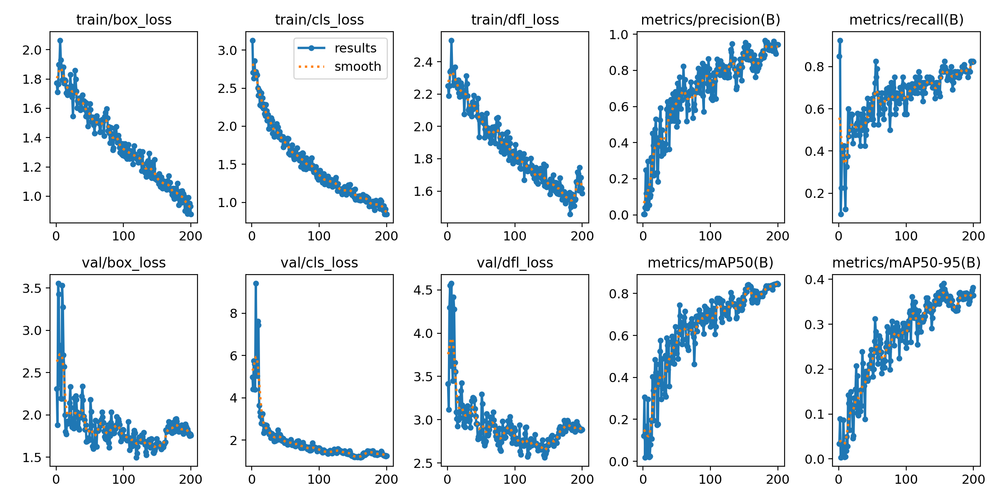

In [ ]:
Image("/content/gdrive/MyDrive/namespace/result/200_epochs-3/results.png")


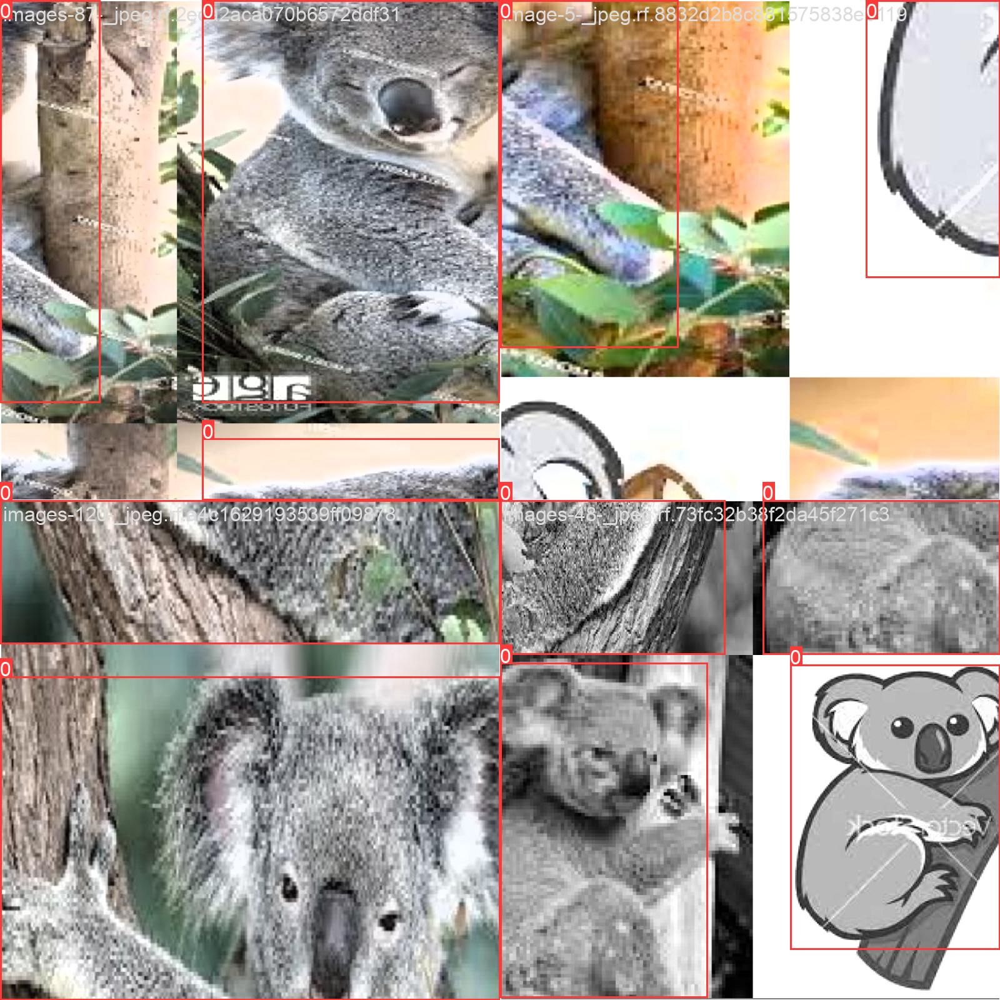

In [ ]:
Image(filename='/content/gdrive/MyDrive/namespace/result/200_epochs-3/train_batch1.jpg', width=400)


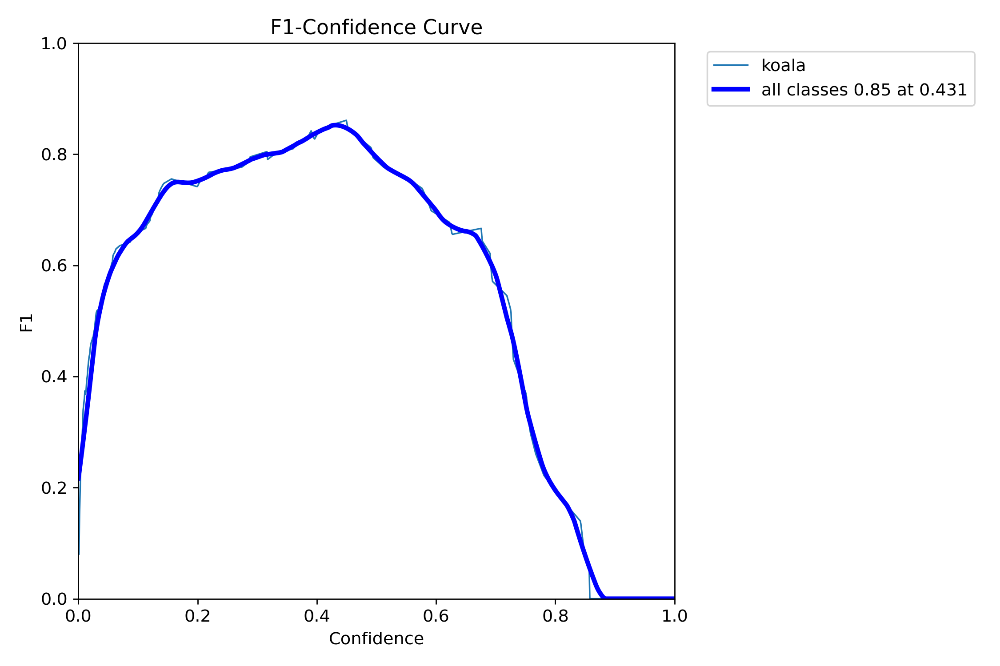

In [ ]:
Image(filename='/content/gdrive/MyDrive/namespace/result/200_epochs-3/F1_curve.png', width=400)


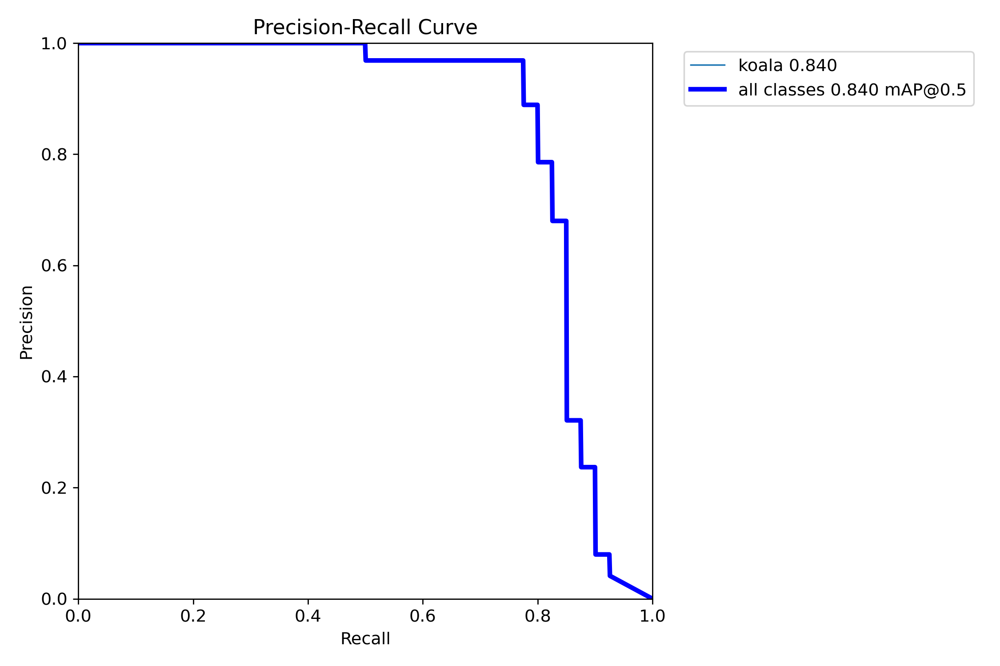

In [ ]:
Image(filename='/content/gdrive/MyDrive/namespace/result/200_epochs-3/PR_curve.png', width=400)

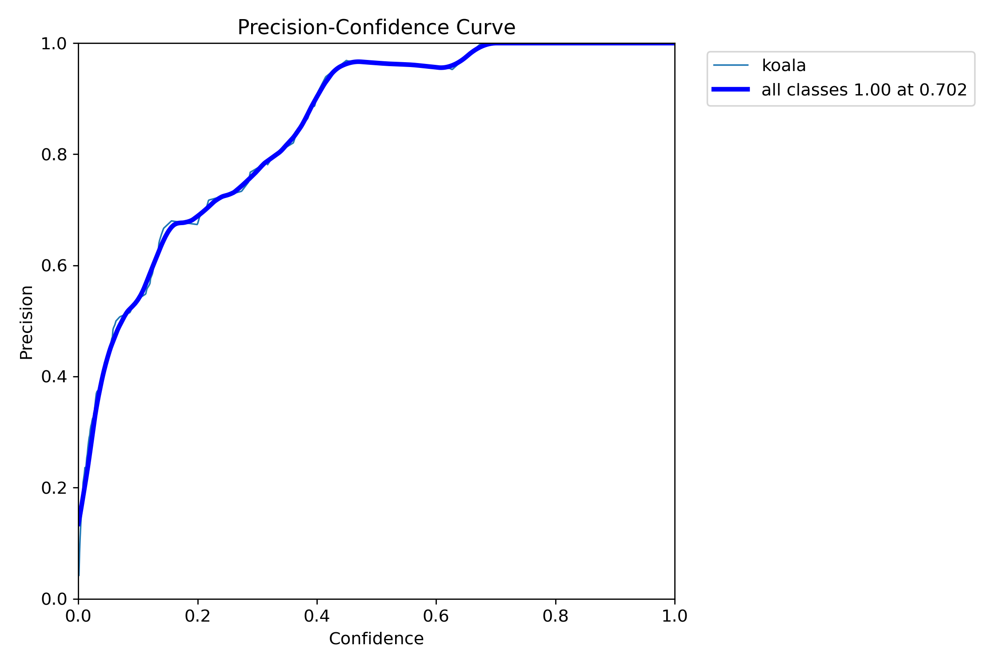

In [ ]:
Image(filename='/content/gdrive/MyDrive/namespace/result/200_epochs-3/P_curve.png', width=400)

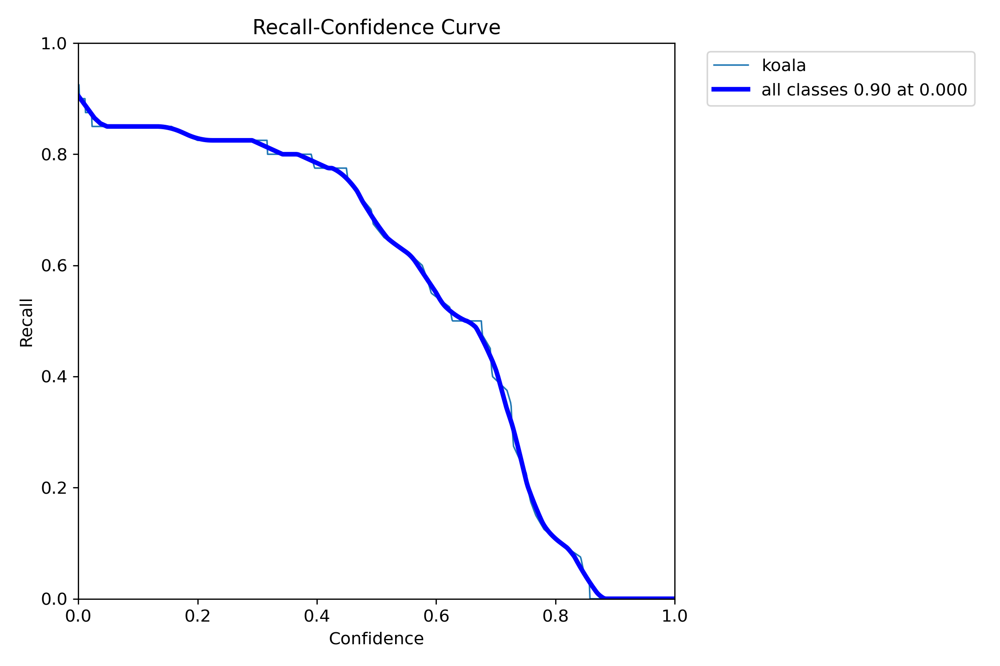

In [ ]:
Image(filename='/content/gdrive/MyDrive/namespace/result/200_epochs-3/R_curve.png', width=400)

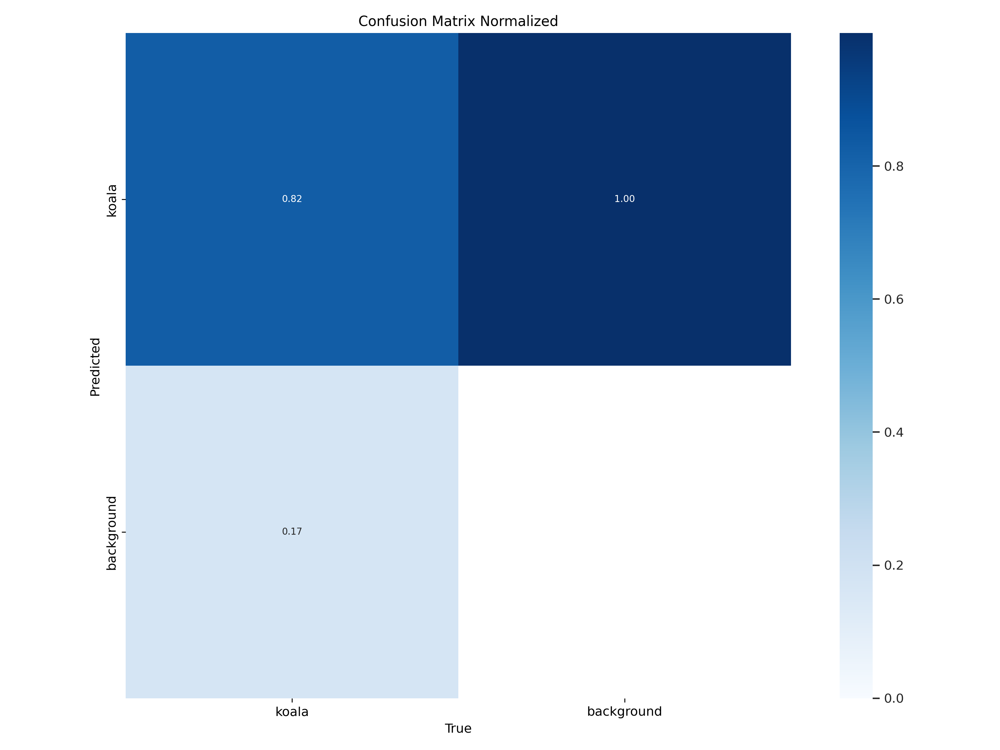

In [ ]:
Image(filename='/content/gdrive/MyDrive/namespace/result/200_epochs-3/confusion_matrix_normalized.png', width=900)

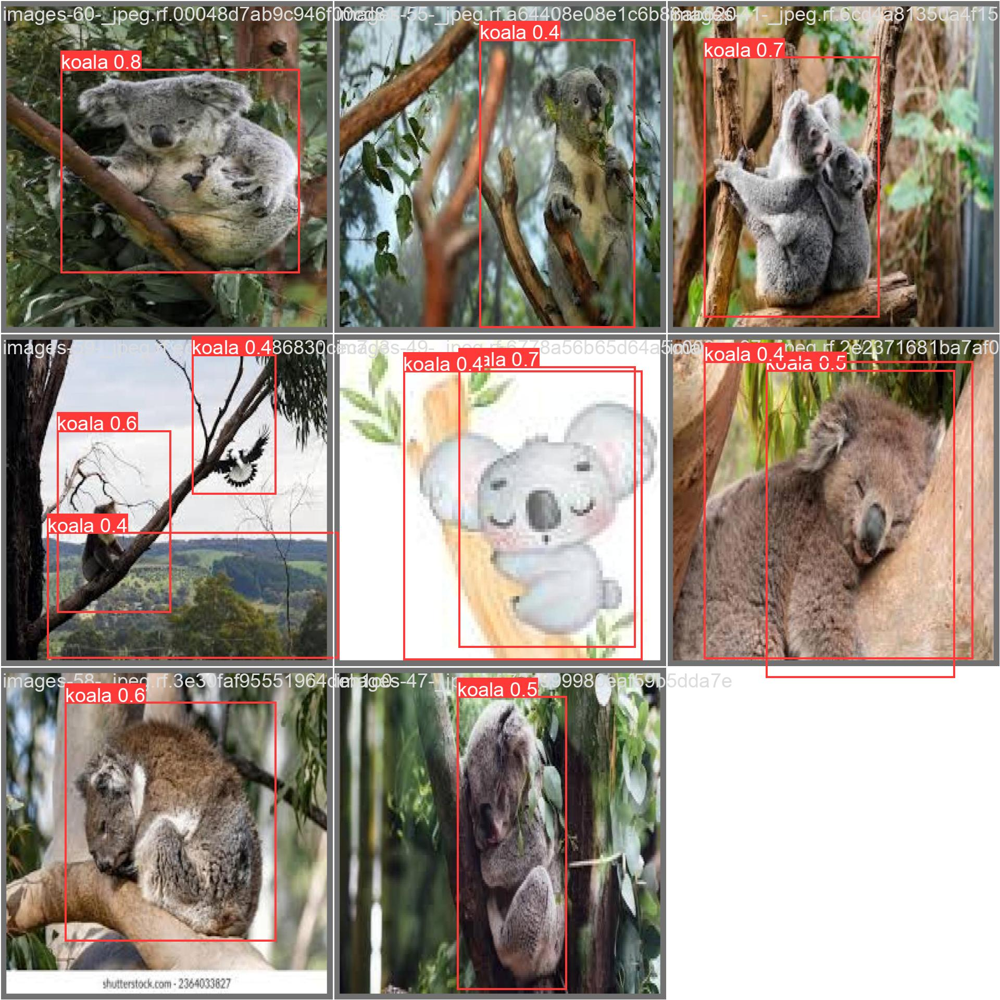

In [ ]:
Image(filename="/content/gdrive/MyDrive/namespace/result/200_epochs-3/val_batch1_pred.jpg", width=500)

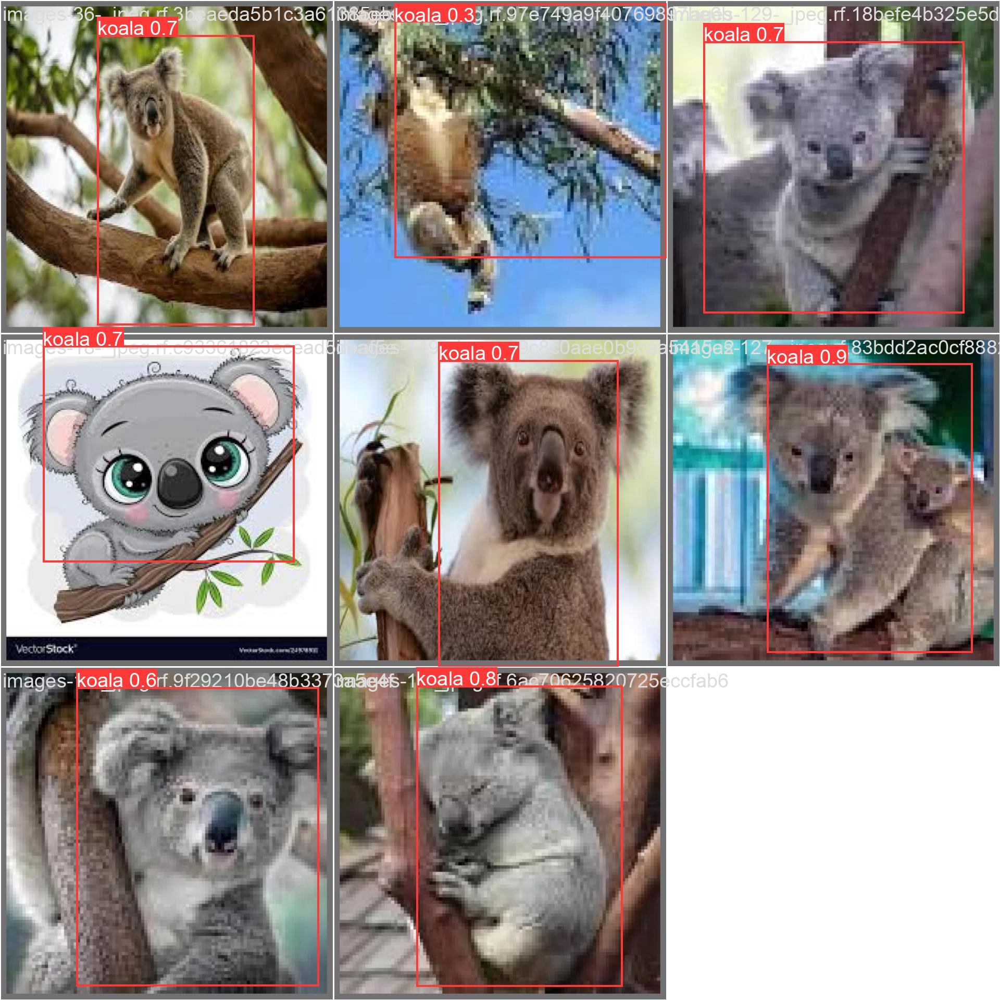

In [ ]:
Image(filename="/content/gdrive/MyDrive/namespace/result/200_epochs-3/val_batch2_pred.jpg",width=600)